# COVID-19 Literature Clustering

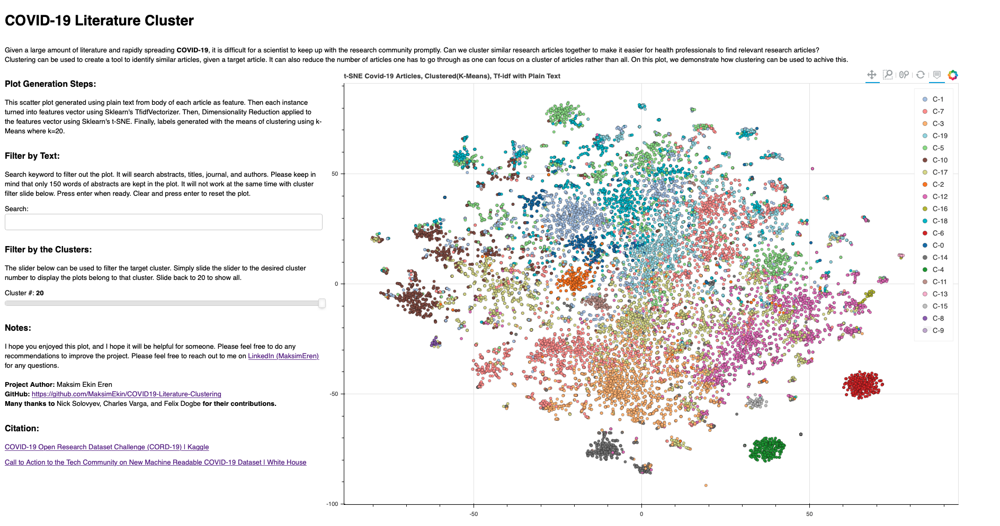

In [1]:
from IPython.display import Image
Image(filename='/kaggle/input/screen-shot/screen_shot.png', width=800) 

### You can find the full version of the interactive plot here on GitHub: 
#### https://maksimekin.github.io/COVID19-Literature-Clustering/plots/t-sne_covid-19_interactive.html
Because of its size, I can only put the smaller version on this Notebook.



### Goal
Given a large amount of literature and rapidly spreading COVID-19, it is difficult for a scientist to keep up with the research community promptly. Can we cluster similar research articles together to make it easier for health professionals to find relevant research articles? Clustering can be used to create a tool to identify similar articles, given a target article. It can also reduce the number of articles one has to go through as one can focus on a cluster of articles rather than all. 

**Approach**:
<ol>
    <li>Unsupervised Learning task, because we don't have labels for the articles</li>
    <li>Clustering and Dimensionality Reduction task </li>
    <li>See how well labels from K-Means classify</li>
    <li>Use N-Grams with Hash Vectorizer</li>
    <li>Use plain text with Tf-idf</li>
    <li>Use K-Means for clustering</li>
    <li>Use t-SNE for dimensionality reduction</li>
    <li>Use PCA for dimensionality reduction</li>
    <li>There is no continuous flow of data, no need to adjust to changing data, and the data is small enough to fit in memmory: Batch Learning</li>
    <li>Altough, there is no continuous flow of data, our approach has to be scalable as there will be more literature later</li>
</ol>

### Dataset Description

>*In response to the COVID-19 pandemic, the White House and a coalition of leading research groups have prepared the COVID-19 Open Research Dataset (CORD-19). CORD-19 is a resource of over 29,000 scholarly articles, including over 13,000 with full text, about COVID-19, SARS-CoV-2, and related coronaviruses. This freely available dataset is provided to the global research community to apply recent advances in natural language processing and other AI techniques to generate new insights in support of the ongoing fight against this infectious disease. There is a growing urgency for these approaches because of the rapid acceleration in new coronavirus literature, making it difficult for the medical research community to keep up.*
#### Cite: [COVID-19 Open Research Dataset Challenge (CORD-19) | Kaggle](https://www.kaggle.com/allen-institute-for-ai/CORD-19-research-challenge) <br>

**Clustering section of the project (cite):** *Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow*, 2nd Edition, by Aurelien Geron (O'Reilly). Copyright 2019 Kiwisoft S.A.S, 978-1-492-03264-9. Machine Learning Practice. Implimenting this section following the Chapter-9 project on O'REILLY's Hands-On Machine Learning. <br>

# Load the Data
Load the data following the notebook by Ivan Ega Pratama, from Kaggle.
#### Cite: [Dataset Parsing Code | Kaggle, COVID EDA: Initial Exploration Tool](https://www.kaggle.com/ivanegapratama/covid-eda-initial-exploration-tool)

### Loading Metadata

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import json

import matplotlib.pyplot as plt
plt.style.use('ggplot')

Let's load the metadata of the dateset. 'title' and 'journal' attributes may be useful later when we cluster the articles to see what kinds of articles cluster together.

In [3]:
!ls /kaggle/input/CORD-19-research-challenge/

COVID.DATA.LIC.AGMT.pdf  comm_use_subset  json_schema.txt  metadata.readme
biorxiv_medrxiv		 custom_license   metadata.csv	   noncomm_use_subset


In [4]:
root_path = '/kaggle/input/CORD-19-research-challenge/'
metadata_path = f'{root_path}/metadata.csv'
meta_df = pd.read_csv(metadata_path, dtype={
    'pubmed_id': str,
    'Microsoft Academic Paper ID': str, 
    'doi': str
})
meta_df.head()

,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text,full_text_file
0,NaN,Elsevier,Intrauterine virus infections and congenital h...,10.1016/0002-8703(72)90077-4,NaN,4361535,els-covid,Abstract The etiologic basis for the vast majo...,1972-12-31,"Overall, James C.",American Heart Journal,NaN,NaN,False,custom_license
1,NaN,Elsevier,Coronaviruses in Balkan nephritis,10.1016/0002-8703(80)90355-5,NaN,6243850,els-covid,NaN,1980-03-31,"Georgescu, Leonida; Diosi, Peter; Buţiu, Ioan;...",American Heart Journal,NaN,NaN,False,custom_license
2,NaN,Elsevier,Cigarette smoking and coronary heart disease: ...,10.1016/0002-8703(80)90356-7,NaN,7355701,els-covid,NaN,1980-03-31,"Friedman, Gary D",American Heart Journal,NaN,NaN,False,custom_license
3,aecbc613ebdab36753235197ffb4f35734b5ca63,Elsevier,Clinical and immunologic studies in identical ...,10.1016/0002-9343(73)90176-9,NaN,4579077,els-covid,"Abstract Middle-aged female identical twins, o...",1973-08-31,"Brunner, Carolyn M.; Horwitz, David A.; Shann,...",The American Journal of Medicine,NaN,NaN,True,custom_license
4,NaN,Elsevier,Epidemiology of community-acquired respiratory...,10.1016/0002-9343(85)90361-4,NaN,4014285,els-covid,Abstract Upper respiratory tract infections ar...,1985-06-28,"Garibaldi, Richard A.",The American Journal of Medicine,NaN,NaN,False,custom_license


In [5]:
meta_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44220 entries, 0 to 44219
Data columns (total 15 columns):
sha                            28462 non-null object
source_x                       44220 non-null object
title                          43996 non-null object
doi                            40750 non-null object
pmcid                          23319 non-null object
pubmed_id                      22943 non-null object
license                        44220 non-null object
abstract                       35806 non-null object
publish_time                   34197 non-null object
authors                        41074 non-null object
journal                        33173 non-null object
Microsoft Academic Paper ID    964 non-null object
WHO #Covidence                 1767 non-null object
has_full_text                  44220 non-null bool
full_text_file                 32829 non-null object
dtypes: bool(1), object(14)
memory usage: 4.8+ MB


### Fetch All of JSON File Path

Get path to all JSON files:

In [6]:
all_json = glob.glob(f'{root_path}/**/*.json', recursive=True)
len(all_json)

29315

### Helper Functions

 File Reader Class

In [7]:
class FileReader:
    def __init__(self, file_path):
        with open(file_path) as file:
            content = json.load(file)
            self.paper_id = content['paper_id']
            self.abstract = []
            self.body_text = []
            # Abstract
            for entry in content['abstract']:
                self.abstract.append(entry['text'])
            # Body text
            for entry in content['body_text']:
                self.body_text.append(entry['text'])
            self.abstract = '\n'.join(self.abstract)
            self.body_text = '\n'.join(self.body_text)
    def __repr__(self):
        return f'{self.paper_id}: {self.abstract[:200]}... {self.body_text[:200]}...'
first_row = FileReader(all_json[0])
print(first_row)

d99acb4e99be7852aa61a688c9fbd38d44b5a252: Live attenuated recombinant measles vaccine virus (MV) Edmonston-Zagreb (EZ) strain was evaluated as a viral vector to express the ectodomains of fusion protein of respiratory syncytial virus (RSV F) ... Live attenuated viruses have been developed and used to help protect humans from various infectious diseases. Live attenuated vaccine viruses simulate natural infection and are highly immunogenic and ...


Helper function adds break after every words when character length reach to certain amount. This is for the interactive plot so that hover tool fits the screen.

In [8]:
def get_breaks(content, length):
    data = ""
    words = content.split(' ')
    total_chars = 0

    # add break every length characters
    for i in range(len(words)):
        total_chars += len(words[i])
        if total_chars > length:
            data = data + "<br>" + words[i]
            total_chars = 0
        else:
            data = data + " " + words[i]
    return data

### Load the Data into DataFrame

Using the helper functions, let's read in the articles into a DataFrame that can be used easily:

In [9]:
dict_ = {'paper_id': [], 'abstract': [], 'body_text': [], 'authors': [], 'title': [], 'journal': [], 'abstract_summary': []}
for idx, entry in enumerate(all_json):
    if idx % (len(all_json) // 10) == 0:
        print(f'Processing index: {idx} of {len(all_json)}')
    content = FileReader(entry)
    
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id]
    # no metadata, skip this paper
    if len(meta_data) == 0:
        continue
    
    dict_['paper_id'].append(content.paper_id)
    dict_['abstract'].append(content.abstract)
    dict_['body_text'].append(content.body_text)
    
    # also create a column for the summary of abstract to be used in a plot
    if len(content.abstract) == 0: 
        # no abstract provided
        dict_['abstract_summary'].append("Not provided.")
    elif len(content.abstract.split(' ')) > 100:
        # abstract provided is too long for plot, take first 300 words append with ...
        info = content.abstract.split(' ')[:100]
        summary = get_breaks(' '.join(info), 40)
        dict_['abstract_summary'].append(summary + "...")
    else:
        # abstract is short enough
        summary = get_breaks(content.abstract, 40)
        dict_['abstract_summary'].append(summary)
        
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id]
    
    try:
        # if more than one author
        authors = meta_data['authors'].values[0].split(';')
        if len(authors) > 2:
            # more than 2 authors, may be problem when plotting, so take first 2 append with ...
            dict_['authors'].append(". ".join(authors[:2]) + "...")
        else:
            # authors will fit in plot
            dict_['authors'].append(". ".join(authors))
    except Exception as e:
        # if only one author - or Null valie
        dict_['authors'].append(meta_data['authors'].values[0])
    
    # add the title information, add breaks when needed
    try:
        title = get_breaks(meta_data['title'].values[0], 40)
        dict_['title'].append(title)
    # if title was not provided
    except Exception as e:
        dict_['title'].append(meta_data['title'].values[0])
    
    # add the journal information
    dict_['journal'].append(meta_data['journal'].values[0])
    
df_covid = pd.DataFrame(dict_, columns=['paper_id', 'abstract', 'body_text', 'authors', 'title', 'journal', 'abstract_summary'])
df_covid.head()

Processing index: 0 of 29315
Processing index: 2931 of 29315
Processing index: 5862 of 29315
Processing index: 8793 of 29315
Processing index: 11724 of 29315
Processing index: 14655 of 29315
Processing index: 17586 of 29315
Processing index: 20517 of 29315
Processing index: 23448 of 29315
Processing index: 26379 of 29315
Processing index: 29310 of 29315


,paper_id,abstract,body_text,authors,title,journal,abstract_summary
0,d99acb4e99be7852aa61a688c9fbd38d44b5a252,Live attenuated recombinant measles vaccine vi...,Live attenuated viruses have been developed an...,"Mok, Hoyin. Cheng, Xing...",Evaluation of Measles Vaccine Virus as a Vect...,Open Virol J,Live attenuated recombinant measles vaccine<b...
1,748d4c57fe1acc8d9d97cf574f7dea5296f9386c,Ebola virus (EBOV) makes extensive and intrica...,occurs primarily through a macropinocytosis-li...,"Spence, Jennifer S.. Krause, Tyler B....",Direct Visualization of Ebola Virus Fusion<br...,mBio,Ebola virus (EBOV) makes extensive and<br>int...
2,b891efc6e1419713b05ff7d89b26d260478c28df,China has the world's second largest tuberculo...,The goal of the present study was to investiga...,"Deng, Yunfeng. Li, Yan...",Tuberculosis prevention in healthcare<br>work...,ERJ Open Res,China has the world's second largest<br>tuber...
3,76d2990a2663635e195b8a9818f9664872b6d3af,Screening for thousands of viruses and other p...,; T-cell leukemia virus type 1; and human T-ce...,"Baldwin, Don A.. Feldman, Michael...",Metagenomic Assay for Identification of<br>Mi...,mBio,Screening for thousands of viruses and other<...
4,5407b1aabede9eeed76c59a7b890be9f513712b7,The evaluation of the immunogenicity of Sabin ...,"Poliomyelitis, caused by poliovirus, is an acu...","Jiang, Zheng. Liu, Guixiu...",A simple and safe antibody neutralization<br>...,Hum Vaccin Immunother,The evaluation of the immunogenicity of Sabin...


In [10]:
dict_ = None

# Adding the Word Count Columns

Adding word count columns for both abstract and body_text can be useful parameters later:

In [11]:
df_covid['abstract_word_count'] = df_covid['abstract'].apply(lambda x: len(x.strip().split()))
df_covid['body_word_count'] = df_covid['body_text'].apply(lambda x: len(x.strip().split()))
df_covid.head()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count
0,d99acb4e99be7852aa61a688c9fbd38d44b5a252,Live attenuated recombinant measles vaccine vi...,Live attenuated viruses have been developed an...,"Mok, Hoyin. Cheng, Xing...",Evaluation of Measles Vaccine Virus as a Vect...,Open Virol J,Live attenuated recombinant measles vaccine<b...,194,5875
1,748d4c57fe1acc8d9d97cf574f7dea5296f9386c,Ebola virus (EBOV) makes extensive and intrica...,occurs primarily through a macropinocytosis-li...,"Spence, Jennifer S.. Krause, Tyler B....",Direct Visualization of Ebola Virus Fusion<br...,mBio,Ebola virus (EBOV) makes extensive and<br>int...,345,5318
2,b891efc6e1419713b05ff7d89b26d260478c28df,China has the world's second largest tuberculo...,The goal of the present study was to investiga...,"Deng, Yunfeng. Li, Yan...",Tuberculosis prevention in healthcare<br>work...,ERJ Open Res,China has the world's second largest<br>tuber...,259,791
3,76d2990a2663635e195b8a9818f9664872b6d3af,Screening for thousands of viruses and other p...,; T-cell leukemia virus type 1; and human T-ce...,"Baldwin, Don A.. Feldman, Michael...",Metagenomic Assay for Identification of<br>Mi...,mBio,Screening for thousands of viruses and other<...,211,6217
4,5407b1aabede9eeed76c59a7b890be9f513712b7,The evaluation of the immunogenicity of Sabin ...,"Poliomyelitis, caused by poliovirus, is an acu...","Jiang, Zheng. Liu, Guixiu...",A simple and safe antibody neutralization<br>...,Hum Vaccin Immunother,The evaluation of the immunogenicity of Sabin...,193,3916


In [12]:
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27678 entries, 0 to 27677
Data columns (total 9 columns):
paper_id               27678 non-null object
abstract               27678 non-null object
body_text              27678 non-null object
authors                26929 non-null object
title                  27634 non-null object
journal                26784 non-null object
abstract_summary       27678 non-null object
abstract_word_count    27678 non-null int64
body_word_count        27678 non-null int64
dtypes: int64(2), object(7)
memory usage: 1.9+ MB


In [13]:
df_covid['abstract'].describe(include='all')

count     27678
unique    20191
top            
freq       7453
Name: abstract, dtype: object

# Handle Possible Duplicates

When we look at the unique values above, we can see that tehre are duplicates. It may have caused because of author submiting the article to multiple journals. Let's remove the duplicats from our dataset:

(Thank you Desmond Yeoh for recommending the below approach on Kaggle)

In [14]:
df_covid.drop_duplicates(['abstract', 'body_text'], inplace=True)
df_covid['abstract'].describe(include='all')

count     27663
unique    20191
top            
freq       7444
Name: abstract, dtype: object

In [15]:
df_covid['body_text'].describe(include='all')

count                                                 27663
unique                                                27662
top       In a global world, knowledge of imported infec...
freq                                                      2
Name: body_text, dtype: object

It looks like we didn't have duplicates. Instead, it was articles without Abstracts.

# Take a Look at the Data:

In [16]:
df_covid.head()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count
0,d99acb4e99be7852aa61a688c9fbd38d44b5a252,Live attenuated recombinant measles vaccine vi...,Live attenuated viruses have been developed an...,"Mok, Hoyin. Cheng, Xing...",Evaluation of Measles Vaccine Virus as a Vect...,Open Virol J,Live attenuated recombinant measles vaccine<b...,194,5875
1,748d4c57fe1acc8d9d97cf574f7dea5296f9386c,Ebola virus (EBOV) makes extensive and intrica...,occurs primarily through a macropinocytosis-li...,"Spence, Jennifer S.. Krause, Tyler B....",Direct Visualization of Ebola Virus Fusion<br...,mBio,Ebola virus (EBOV) makes extensive and<br>int...,345,5318
2,b891efc6e1419713b05ff7d89b26d260478c28df,China has the world's second largest tuberculo...,The goal of the present study was to investiga...,"Deng, Yunfeng. Li, Yan...",Tuberculosis prevention in healthcare<br>work...,ERJ Open Res,China has the world's second largest<br>tuber...,259,791
3,76d2990a2663635e195b8a9818f9664872b6d3af,Screening for thousands of viruses and other p...,; T-cell leukemia virus type 1; and human T-ce...,"Baldwin, Don A.. Feldman, Michael...",Metagenomic Assay for Identification of<br>Mi...,mBio,Screening for thousands of viruses and other<...,211,6217
4,5407b1aabede9eeed76c59a7b890be9f513712b7,The evaluation of the immunogenicity of Sabin ...,"Poliomyelitis, caused by poliovirus, is an acu...","Jiang, Zheng. Liu, Guixiu...",A simple and safe antibody neutralization<br>...,Hum Vaccin Immunother,The evaluation of the immunogenicity of Sabin...,193,3916


In [17]:
df_covid.describe()

,abstract_word_count,body_word_count
count,27663.000000,27663.000000
mean,165.454325,4886.198026
std,175.660928,7494.247433
min,0.000000,1.000000
25%,0.000000,2503.500000
50%,162.000000,3760.000000
75%,240.000000,5531.000000
max,4767.000000,260378.000000


# Data Pre-processing

Now that we have our dataset loaded, we need to clean-up the text to improve any clustering or classification efforts. First, let's drop Null vales:

In [18]:
df_covid.dropna(inplace=True)
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26043 entries, 0 to 27677
Data columns (total 9 columns):
paper_id               26043 non-null object
abstract               26043 non-null object
body_text              26043 non-null object
authors                26043 non-null object
title                  26043 non-null object
journal                26043 non-null object
abstract_summary       26043 non-null object
abstract_word_count    26043 non-null int64
body_word_count        26043 non-null int64
dtypes: int64(2), object(7)
memory usage: 2.0+ MB


Limit number of articles to speed up computation:

In [19]:
df_covid = df_covid.head(12500)

Now let's remove punctuation from each text:

In [20]:
import re

df_covid['body_text'] = df_covid['body_text'].apply(lambda x: re.sub('[^a-zA-z0-9\s]','',x))
df_covid['abstract'] = df_covid['abstract'].apply(lambda x: re.sub('[^a-zA-z0-9\s]','',x))

Convert each text to lower case:

In [21]:
def lower_case(input_str):
    input_str = input_str.lower()
    return input_str

df_covid['body_text'] = df_covid['body_text'].apply(lambda x: lower_case(x))
df_covid['abstract'] = df_covid['abstract'].apply(lambda x: lower_case(x))

In [22]:
df_covid.head(4)

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count
0,d99acb4e99be7852aa61a688c9fbd38d44b5a252,live attenuated recombinant measles vaccine vi...,live attenuated viruses have been developed an...,"Mok, Hoyin. Cheng, Xing...",Evaluation of Measles Vaccine Virus as a Vect...,Open Virol J,Live attenuated recombinant measles vaccine<b...,194,5875
1,748d4c57fe1acc8d9d97cf574f7dea5296f9386c,ebola virus ebov makes extensive and intricate...,occurs primarily through a macropinocytosislik...,"Spence, Jennifer S.. Krause, Tyler B....",Direct Visualization of Ebola Virus Fusion<br...,mBio,Ebola virus (EBOV) makes extensive and<br>int...,345,5318
2,b891efc6e1419713b05ff7d89b26d260478c28df,china has the worlds second largest tuberculos...,the goal of the present study was to investiga...,"Deng, Yunfeng. Li, Yan...",Tuberculosis prevention in healthcare<br>work...,ERJ Open Res,China has the world's second largest<br>tuber...,259,791
3,76d2990a2663635e195b8a9818f9664872b6d3af,screening for thousands of viruses and other p...,tcell leukemia virus type 1 and human tcell l...,"Baldwin, Don A.. Feldman, Michael...",Metagenomic Assay for Identification of<br>Mi...,mBio,Screening for thousands of viruses and other<...,211,6217


Now that we have the text cleaned up, we can create our features vector which can be fed into a clustering or dimensionality reduction algorithm. For our first try, we will focus on the text on the body of the articles. Let's grab that:

In [23]:
text = df_covid.drop(["paper_id", "abstract", "abstract_word_count", "body_word_count", "authors", "title", "journal", "abstract_summary"], axis=1)

In [24]:
text.head(5)

,body_text
0,live attenuated viruses have been developed an...
1,occurs primarily through a macropinocytosislik...
2,the goal of the present study was to investiga...
3,tcell leukemia virus type 1 and human tcell l...
4,poliomyelitis caused by poliovirus is an acute...


Let's transform 1D DataFrame into 1D list where each index is an article (instance), so that we can work with words from each instance:

In [25]:
text_arr = text.stack().tolist()
len(text_arr)

12500

# 2-Grams

Let's create 2D list, where each row is instance and each column is a word. Meaning, we will separate each instance into words:  

In [26]:
words = []
for ii in range(0,len(text)):
    words.append(str(text.iloc[ii]['body_text']).split(" "))

In [27]:
print(words[0][:10])

['live', 'attenuated', 'viruses', 'have', 'been', 'developed', 'and', 'used', 'to', 'help']


What we want now is n-grams from the words where n=2 (2-gram). We will still have 2D array where each row is an instance; however, each index in that row going to be a 2-gram:

In [28]:
n_gram_all = []

for word in words:
    # get n-grams for the instance
    n_gram = []
    for i in range(len(word)-2+1):
        n_gram.append("".join(word[i:i+2]))
    n_gram_all.append(n_gram)

In [29]:
n_gram_all[0][:10]

['liveattenuated',
 'attenuatedviruses',
 'viruseshave',
 'havebeen',
 'beendeveloped',
 'developedand',
 'andused',
 'usedto',
 'tohelp',
 'helpprotect']

# Vectorize with HashingVectorizer

Now we will use HashVectorizer to create the features vector X. For now, let's limit the feature size to 2**12(4096) to speed up the computation. We might need to increase this later to reduce the collusions and improve the accuracy:

In [30]:
from sklearn.feature_extraction.text import HashingVectorizer

# hash vectorizer instance
hvec = HashingVectorizer(lowercase=False, analyzer=lambda l:l, n_features=2**12)

# features matrix X
X = hvec.fit_transform(n_gram_all)

In [31]:
X.shape

(12500, 4096)

#### Separete Training and Test Set

In [32]:
from sklearn.model_selection import train_test_split

# test set size of 20% of the data and the random seed 42 <3
X_train, X_test = train_test_split(X.toarray(), test_size=0.2, random_state=42)

print("X_train size:", len(X_train))
print("X_test size:", len(X_test), "\n")

X_train size: 10000
X_test size: 2500 



# Dimensionality Reduction with t-SNE
Using t-SNE we can reduce our high dimensional features vector into 2 dimensional plane. In the process, t-SNE will keep similar instances together while trying to push different instances far from each other. Resulting 2-D plane can be useful to see which articles cluster near each other:

In [33]:
from sklearn.manifold import TSNE

tsne = TSNE(verbose=1, perplexity=5)
X_embedded = tsne.fit_transform(X_train)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 10000 samples in 17.603s...
[t-SNE] Computed neighbors for 10000 samples in 1195.511s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.131599
[t-SNE] KL divergence after 250 iterations with early exaggeration: 137.875183
[t-SNE] KL divergence after 1000 iterations: 3.776476


Let's plot the result:

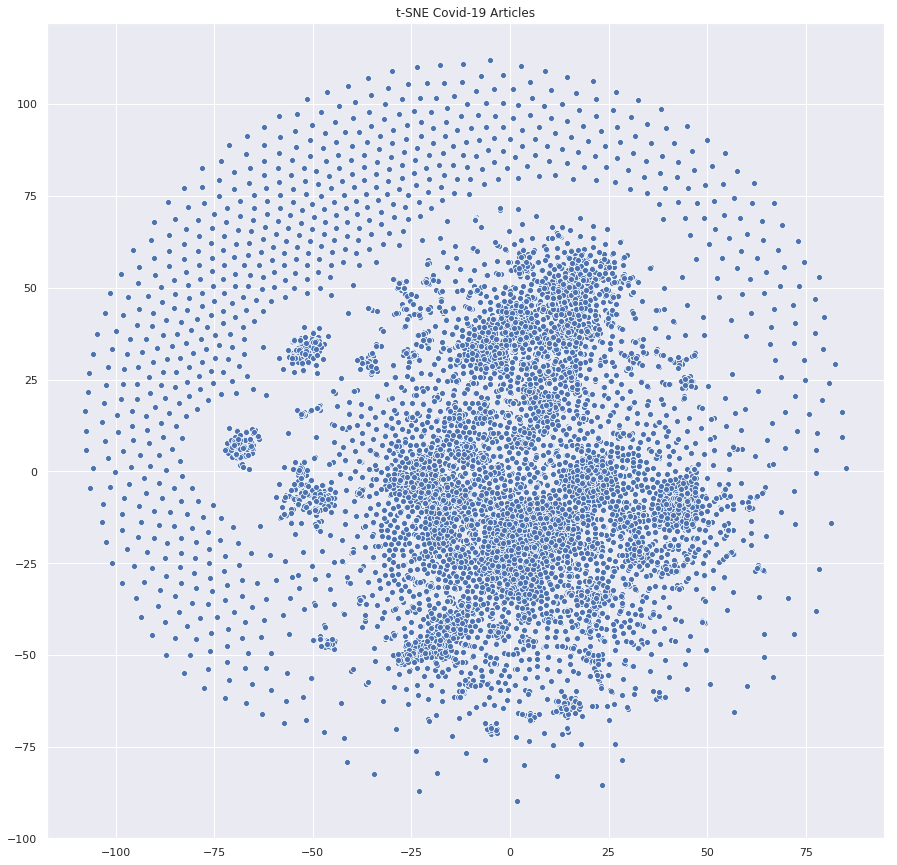

In [34]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=palette)

plt.title("t-SNE Covid-19 Articles")
# plt.savefig("plots/t-sne_covid19.png")
plt.show()

We can clearly see few clusters forming. This may be a good sign that we are able to cluster similar articles together using 2-grams and HashVectorizer with 2**10 features. However, without labels it is difficult to see the clusters. For now, it looks like a blob of data... Let's try if we can use K-Means to generate our labels. We can later use this information to produce a scatterplot with labels to verify the clusters.

# Unsupervised Learning: Clustering with K-Means

Using K-means we will get the labels we need. For now, we will create 10 clusters. I am choosing this arbitrarily. We can change this later.

In [35]:
from sklearn.cluster import KMeans

k = 10
kmeans = KMeans(n_clusters=k, n_jobs=4, verbose=10)
y_pred = kmeans.fit_predict(X_train)

Labels for the training set:

In [36]:
y_train = y_pred

Labels for the test set:

In [37]:
y_test = kmeans.predict(X_test)

Now that we have the labels, let's plot the t-SNE. scatterplot again and see if we have any obvious clusters:

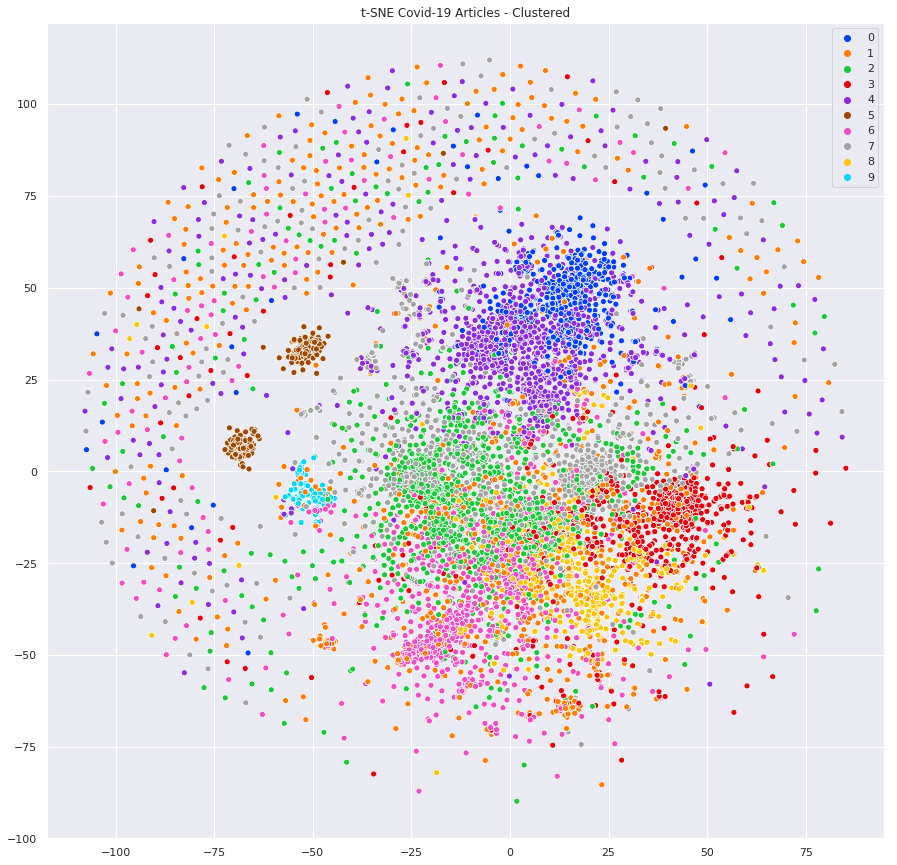

In [38]:
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", len(set(y_pred)))

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered")
# plt.savefig("plots/t-sne_covid19_label.png")
plt.show()

That looks pretty promising. It can be seen that articles from the same cluster are near each other, forming groups. There are still overlaps. So we will have to see if we can improve this by changing the cluster size, using another clustering algorithm, or different feature size. We can also consider not using 2-grams, or HashVectorizer. We can try 3-grams, 4-grams, or plain text as our instances and vectorize them using either HashVectorizer, Tf-idfVectorizer, or Burrows Wheeler Transform Distance. <br>

Before we try another method for clustering, we want to see how well it will classify using the labels we just created using K-Means.

# Classify

### Helper Function:

In [39]:
# function to print out classification model report
def classification_report(model_name, test, pred):
    from sklearn.metrics import precision_score, recall_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import f1_score
    
    print(model_name, ":\n")
    print("Accuracy Score: ", '{:,.3f}'.format(float(accuracy_score(test, pred)) * 100), "%")
    print("     Precision: ", '{:,.3f}'.format(float(precision_score(test, pred, average='micro')) * 100), "%")
    print("        Recall: ", '{:,.3f}'.format(float(recall_score(test, pred, average='micro')) * 100), "%")
    print("      F1 score: ", '{:,.3f}'.format(float(f1_score(test, pred, average='micro')) * 100), "%")

### Random Forest

In [40]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# random forest classifier instance
forest_clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=4)

# cross validation on the training set 
forest_scores = cross_val_score(forest_clf, X_train, y_train, cv=3, n_jobs=4)

# print out the mean of the cross validation scores
print("Accuracy: ", '{:,.3f}'.format(float(forest_scores.mean()) * 100), "%")

Accuracy:  71.740 %


In [41]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import precision_score, recall_score

# cross validate predict on the training set
forest_train_pred = cross_val_predict(forest_clf, X_train, y_train, cv=3, n_jobs=4)

# print precision and recall scores
print("Precision: ", '{:,.3f}'.format(float(precision_score(y_train, forest_train_pred, average='macro')) * 100), "%")
print("   Recall: ", '{:,.3f}'.format(float(recall_score(y_train, forest_train_pred, average='macro')) * 100), "%")

Precision:  79.915 %
   Recall:  66.141 %


In [42]:
# first train the model
forest_clf.fit(X_train, y_train)

# make predictions on the test set
forest_pred = forest_clf.predict(X_test)

In [43]:
# print out the classification report
classification_report("Random Forest Classifier Report (Test Set)", y_test, forest_pred)

Random Forest Classifier Report (Test Set) :

Accuracy Score:  74.000 %
     Precision:  74.000 %
        Recall:  74.000 %
      F1 score:  74.000 %


It looks like it doesn't overfit, which is good news. But results can be better than ~70-80%. So we might want to come back to this later again to see if we can improve it.  

# Vectorize Using Tf-idf with Plain Text
Let's see if we will be able to get better clusters using plain text as instances rather than 2-grams and vectorize it using Tf-idf. Last time we separated the dataset into test and training sets because we wanted to do classification with the labels we got through clustering. This time we will just use the all dataset because the goal is to cluster all literature.

### Vectorize

In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=2**12)
X = vectorizer.fit_transform(df_covid['body_text'].values)

In [45]:
X.shape

(12500, 4096)

# MiniBatchKMeans with Plain text and Tf-idf

Again, let's try to get our labels. We will choose 10 clusters again. This time, we will use MiniBatchKMeans as it is faster with more data:

In [46]:
from sklearn.cluster import MiniBatchKMeans

k = 10
kmeans = MiniBatchKMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)

Get the labels:

In [47]:
y = y_pred

# Dimensionality Reduction with t-SNE (Plain text and Tf-idf)

Let's reduce the dimensionality using t-SNE again:

In [48]:
from sklearn.manifold import TSNE

tsne = TSNE(verbose=1)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 12500 samples in 22.686s...
[t-SNE] Computed neighbors for 12500 samples in 1686.501s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12500
[t-SNE] Computed conditional probabilities for sample 2000 / 12500
[t-SNE] Computed conditional probabilities for sample 3000 / 12500
[t-SNE] Computed conditional probabilities for sample 4000 / 12500
[t-SNE] Computed conditional probabilities for sample 5000 / 12500
[t-SNE] Computed conditional probabilities for sample 6000 / 12500
[t-SNE] Computed conditional probabilities for sample 7000 / 12500
[t-SNE] Computed conditional probabilities for sample 8000 / 12500
[t-SNE] Computed conditional probabilities for sample 9000 / 12500
[t-SNE] Computed conditional probabilities for sample 10000 / 12500
[t-SNE] Computed conditional probabilities for sample 11000 / 12500
[t-SNE] Computed conditional probabilities for sample 12000 / 12500
[t-SNE] Computed conditional probabilities for

### Plot t-SNE

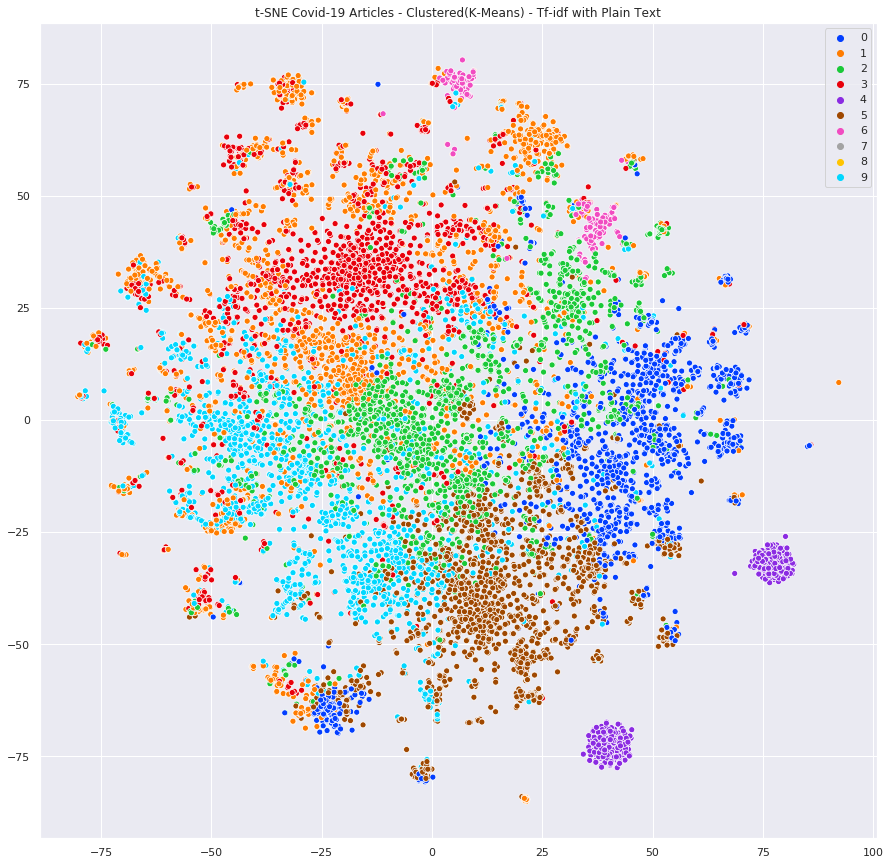

In [49]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", len(set(y)))

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered(K-Means) - Tf-idf with Plain Text")
# plt.savefig("plots/t-sne_covid19_label_TFID.png")
plt.show()

This time we are able to see the clusters more clearly. There are clusters that further apart from each other. I can also start to see that there is possibly more than 10 clusters we need to identify using k-means.

# Dimensionality Reduction with PCA (Plain text and Tf-idf)

t-SNE doesn't scale well. This is why run-time of this Notebook is about 40 minutes to 1 hour with an average computer. Let's try to see if we dan achive good results with PCA as it scales very well with larger datasets and dimensions:

In [50]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
pca_result = pca.fit_transform(X.toarray())

### Plot PCA

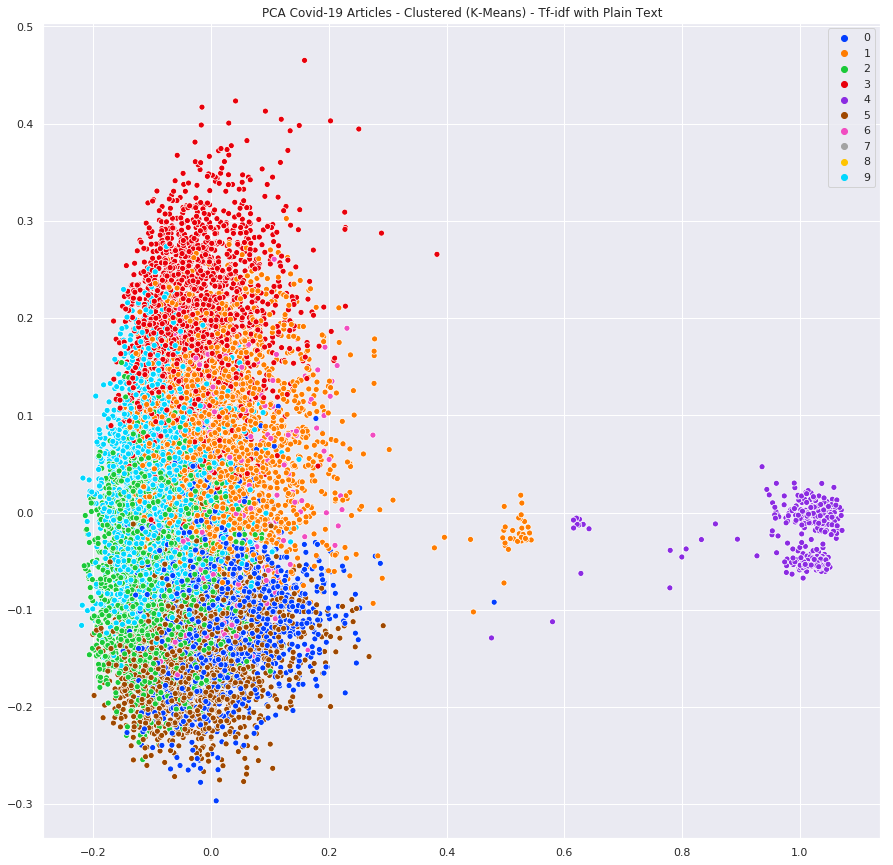

In [51]:
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", len(set(y)))

# plot
sns.scatterplot(pca_result[:,0], pca_result[:,1], hue=y, legend='full', palette=palette)
plt.title("PCA Covid-19 Articles - Clustered (K-Means) - Tf-idf with Plain Text")
# plt.savefig("plots/pca_covid19_label_TFID.png")
plt.show()

Sometimes it may be easier to see the results in a 3 dimensional plot. So let's try to do that:

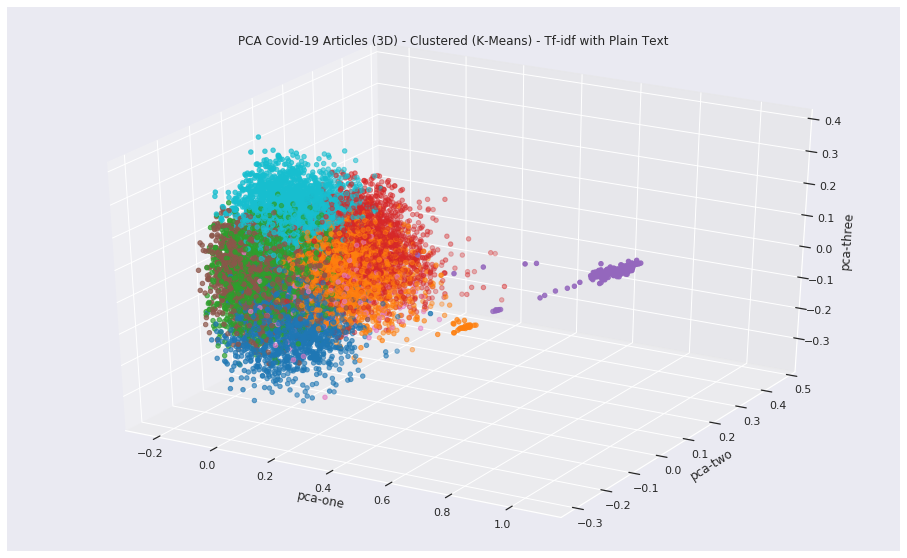

In [52]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=pca_result[:,0], 
    ys=pca_result[:,1], 
    zs=pca_result[:,2], 
    c=y, 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.title("PCA Covid-19 Articles (3D) - Clustered (K-Means) - Tf-idf with Plain Text")
# plt.savefig("plots/pca_covid19_label_TFID_3d.png")
plt.show()

# More Clusters?
On our previous plot we could see that there is more clusters than only 10. Let's try to label them:

In [53]:
from sklearn.cluster import MiniBatchKMeans

k = 20
kmeans = MiniBatchKMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)
y = y_pred

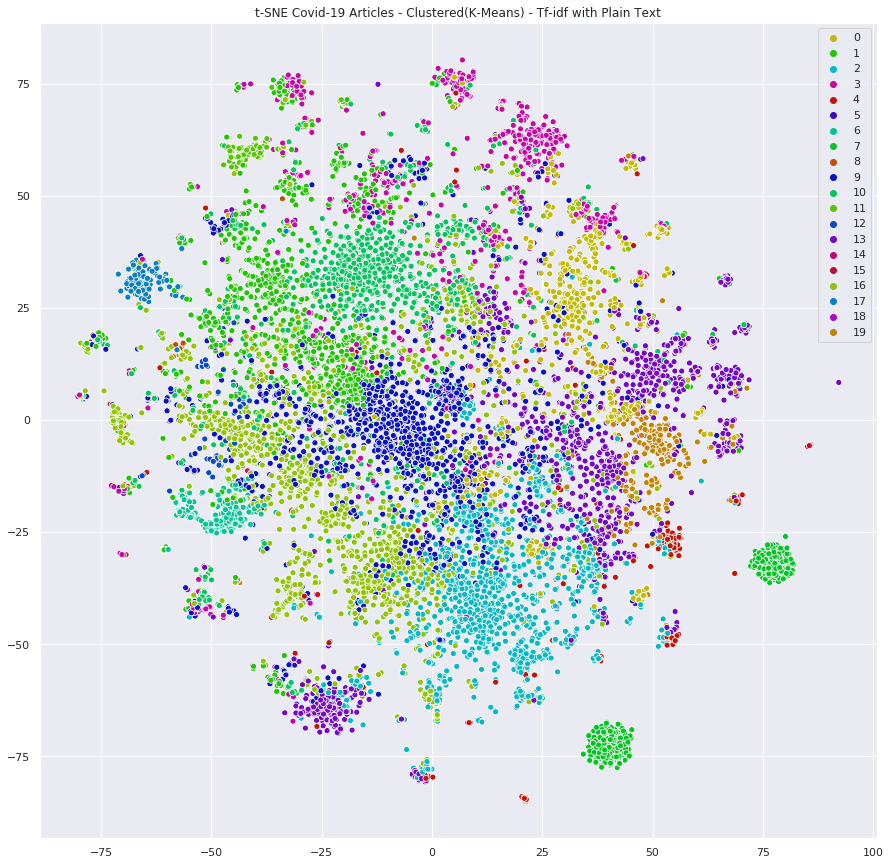

In [54]:
from matplotlib import pyplot as plt
import seaborn as sns
import random 

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# let's shuffle the list so distinct colors stay next to each other
palette = sns.hls_palette(20, l=.4, s=.9)
random.shuffle(palette)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered(K-Means) - Tf-idf with Plain Text")
# plt.savefig("plots/t-sne_covid19_20label_TFID.png")
plt.show()

It would be helpful if we have a demo tool that can be used to see what articles are identified as similar using our Clustering and Dimensionality Reduction, right? Let's put together a interactive scatter plot of t-SNE to do that.

# Interactive t-SNE

In [55]:
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap
from bokeh.io import output_file, show
from bokeh.transform import transform
from bokeh.io import output_notebook
from bokeh.plotting import figure
from bokeh.layouts import column
from bokeh.models import RadioButtonGroup
from bokeh.models import TextInput
from bokeh.layouts import gridplot
from bokeh.models import Div
from bokeh.models import Paragraph
from bokeh.layouts import column, widgetbox

output_notebook()
y_labels = y_pred

# data sources
source = ColumnDataSource(data=dict(
    x= X_embedded[:,0], 
    y= X_embedded[:,1],
    x_backup = X_embedded[:,0],
    y_backup = X_embedded[:,1],
    desc= y_labels, 
    titles= df_covid['title'],
    authors = df_covid['authors'],
    journal = df_covid['journal'],
    abstract = df_covid['abstract_summary'],
    labels = ["C-" + str(x) for x in y_labels]
    ))

# hover over information
hover = HoverTool(tooltips=[
    ("Title", "@titles{safe}"),
    ("Author(s)", "@authors"),
    ("Journal", "@journal"),
    ("Abstract", "@abstract{safe}"),
],
                 point_policy="follow_mouse")

# map colors
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[20],
                     low=min(y_labels) ,high=max(y_labels))

# prepare the figure
p = figure(plot_width=800, plot_height=800, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset'], 
           title="t-SNE Covid-19 Articles, Clustered(K-Means), Tf-idf with Plain Text", 
           toolbar_location="right")

# plot
p.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black",
          legend = 'labels')

# add callback to control 
callback = CustomJS(args=dict(p=p, source=source), code="""
            
            var radio_value = cb_obj.active;
            var data = source.data; 
            
            x = data['x'];
            y = data['y'];
            
            x_backup = data['x_backup'];
            y_backup = data['y_backup'];
            
            labels = data['desc'];
            
            if (radio_value == '20') {
                for (i = 0; i < x.length; i++) {
                    x[i] = x_backup[i];
                    y[i] = y_backup[i];
                }
            }
            else {
                for (i = 0; i < x.length; i++) {
                    if(labels[i] == radio_value) {
                        x[i] = x_backup[i];
                        y[i] = y_backup[i];
                    } else {
                        x[i] = undefined;
                        y[i] = undefined;
                    }
                }
            }


        source.change.emit();
        """)

# callback for searchbar
keyword_callback = CustomJS(args=dict(p=p, source=source), code="""
            
            var text_value = cb_obj.value;
            var data = source.data; 
            
            x = data['x'];
            y = data['y'];
            
            x_backup = data['x_backup'];
            y_backup = data['y_backup'];
            
            abstract = data['abstract'];
            titles = data['titles'];
            authors = data['authors'];
            journal = data['journal'];

            for (i = 0; i < x.length; i++) {
                if(abstract[i].includes(text_value) || 
                   titles[i].includes(text_value) || 
                   authors[i].includes(text_value) || 
                   journal[i].includes(text_value)) {
                    x[i] = x_backup[i];
                    y[i] = y_backup[i];
                } else {
                    x[i] = undefined;
                    y[i] = undefined;
                }
            }
            


        source.change.emit();
        """)

# option
option = RadioButtonGroup(labels=["C-0", "C-1", "C-2",
                                  "C-3", "C-4", "C-5",
                                  "C-6", "C-7", "C-8",
                                  "C-9", "C-10", "C-11",
                                  "C-12", "C-13", "C-14",
                                  "C-15", "C-16", "C-17",
                                  "C-18", "C-19", "All"], 
                          active=20, callback=callback)

# search box
keyword = TextInput(title="Search:", callback=keyword_callback)

#header
header = Div(text="""<h1>COVID-19 Literature Cluster</h1>""")

# show
show(column(header, widgetbox(option, keyword),p))

Loading BokehJS ...

#### Please see the tools on right top.
#### If the text doesn't fit in the screen on the above plot when hover, please try the 'Box Zoom' tool to zoom to the area where the target plot is. This will help the hover message to fit the screen. 
#### Use the 'Reset' button to revert the zoom.